In [ ]:
%load_ext autoreload
%autoreload 2

import  torch
from    tqdm.auto import tqdm
from    pathlib import Path
from    torch.utils.data import DataLoader

from    src.ipynb_utils import HorizontalVisBuffer
import  src.visualize as vis
from    src.dataset import SphereDataset


N_EPOCHS, BATCH_SIZE  = 500, 64
N_POINTS              = 512
N_DENOISE_STEPS       = 64
N_SEEK_STEPS          = 3
N_PARTICLES           = 6
STEP_SIZE             = 2.0
KAPPA                 = 0.001

SAMPLER_KWARGS        = dict(n_denoise_steps=N_DENOISE_STEPS, step_size=STEP_SIZE, n_points=N_POINTS)
AIS_SAMPLER_KWARGS    = dict(kappa=KAPPA, n_seek_steps=N_SEEK_STEPS, n_particles=N_PARTICLES) | SAMPLER_KWARGS

DEVICE                = 'cuda:0' if torch.cuda.is_available() else 'cpu'
torch.set_default_device(DEVICE)

LOADER                = DataLoader(SphereDataset(n_pts=N_POINTS, device=DEVICE), batch_size=BATCH_SIZE, shuffle=True, generator=torch.Generator(device=DEVICE))
CHECKPOINT_DIR        = Path().cwd() / 'checkpoints'
VISUALIZATION_DIR     = Path().cwd() / 'visualizations'
horizontal_vis_buffer = HorizontalVisBuffer(frames_per_gif=N_DENOISE_STEPS, fps=12)



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [98]:
# -- load (or train) all experts
from src.experts import GenerativeExpert_Axis, AnalyticExpert_Monochrome

expert_x    = GenerativeExpert_Axis(axis='x', n_epochs=N_EPOCHS)
expert_y    = GenerativeExpert_Axis(axis='y', n_epochs=N_EPOCHS)
expert_z    = GenerativeExpert_Axis(axis='z', n_epochs=N_EPOCHS)
expert_mono = AnalyticExpert_Monochrome()

# -- these models provide sa reward for 'particles' (aka clouds) of a certain color
from src.experts import DiscriminativeExpert_Color

discriminator_red   = DiscriminativeExpert_Color(color='r')
discriminator_green = DiscriminativeExpert_Color(color='g')
discriminator_blue  = DiscriminativeExpert_Color(color='b')


In [99]:
for expert in tqdm((expert_x, expert_y, expert_z, expert_mono), desc='Loading experts'):
    if (ckpt := CHECKPOINT_DIR / f"{expert.name}.pt").exists():
        expert.load_state_dict(torch.load(ckpt)) ; continue
    
    expert.train_loop(LOADER, ckpt_dir=CHECKPOINT_DIR, progress_bar=tqdm(range(N_EPOCHS), desc=f'Training {expert.name}'))


Loading experts:   0%|          | 0/4 [00:00<?, ?it/s]

Training expert_mono_analytic:   0%|          | 0/500 [00:00<?, ?it/s]

Visualizing generative experts...:   0%|          | 0/256 [00:00<?, ?it/s]


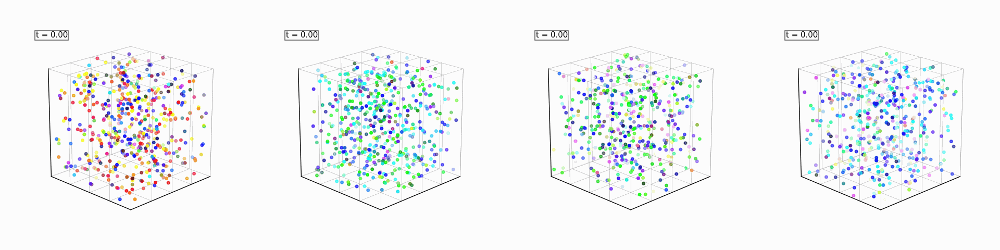

In [103]:

from src.samplers import euler_sampling

generative_experts = [expert_x, expert_y, expert_z, expert_mono]
vis_progress_bar   = tqdm(range(N_DENOISE_STEPS * len(generative_experts)), desc='Visualizing generative experts...')

for expert in generative_experts:
    denoised_trajectory = euler_sampling(expert=expert, **SAMPLER_KWARGS)
    frames              = vis.render_points_over_time(denoised_trajectory, show_path=True, progress_bar=vis_progress_bar)
    horizontal_vis_buffer.push(expert.name, frames)

# -- notice how the spheres have a saturn-ring, corresponding to the points that are
# already in the appropriate location axis coordinate yet the model is not expressive enough
# to re-construct it entirely
horizontal_vis_buffer.display(filename='generative_experts.gif') ; horizontal_vis_buffer.clear()


Visualizing discriminative experts...:   0%|          | 0/192 [00:00<?, ?it/s]


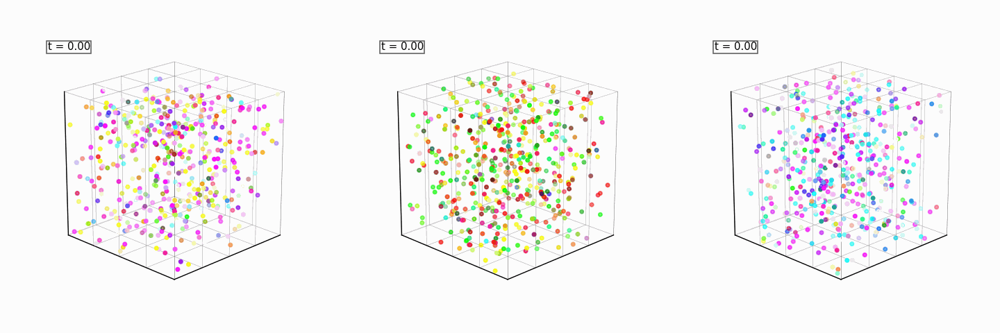

In [107]:
from src.samplers import annealed_importance_sampling

discriminative_experts    = [discriminator_red, discriminator_green, discriminator_blue]
vis_progress_bar          = tqdm(range(N_DENOISE_STEPS * len(discriminative_experts)), desc='Visualizing discriminative experts...')

for expert_color in discriminative_experts:
    denoised_trajectory = annealed_importance_sampling(generative_experts, [expert_color], **AIS_SAMPLER_KWARGS)
    frames              = vis.render_points_over_time(denoised_trajectory, show_path=True, progress_bar=vis_progress_bar)
    horizontal_vis_buffer.push(expert_color.name, frames)

# -- the spheres, for each respective expert, now are evolved to maximize each chosen color!
# also, there are no saturn-ring artifacts anymore!
horizontal_vis_buffer.display(filename='discriminative_and_generative_experts.gif') ; horizontal_vis_buffer.clear()